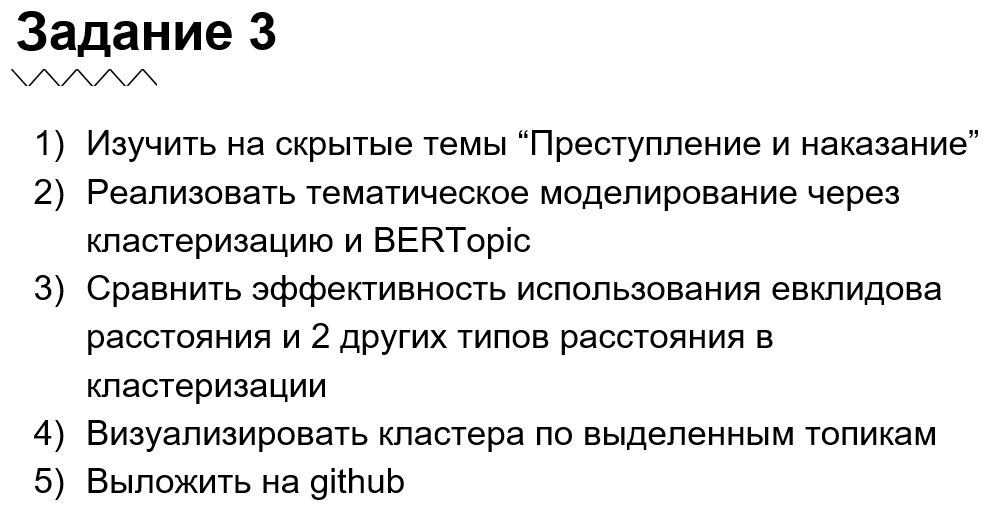

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# %pip install nltk
# !pip install tokenizers
# !pip install bertopic
# %pip install pymorphy2
# %pip install wordcloud
# %pip install spacy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import nltk
import pandas as pd
import numpy as np
import re
import unicodedata
import torch
import pymorphy2
import spacy

from umap import UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer

from bertopic import BERTopic

from nltk.corpus import stopwords

from nltk.tokenize import word_tokenize


OSError: [WinError 126] Не найден указанный модуль. Error loading "c:\Users\User\Desktop\GlowByte\GlowByte\.venv\Lib\site-packages\torch\lib\fbgemm.dll" or one of its dependencies.

In [4]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [5]:
stopwords = set(stopwords.words('russian') + stopwords.words('french'))

In [962]:
file_path = '/content/drive/MyDrive/GlowByte/Crime And Punishment.txt'

with open(file_path, 'r', encoding = 'utf-8') as file:
    text = file.read()

In [963]:
text[:100]

'Annotation\n\n\n«Преступление и наказание» – гениальный роман, главные темы которого: преступление и на'

### Обработка текста

+ чищу аннотацию
+ удаляю объявление главы во всем тексте
+ заменяю сокращенные термины
+ в тексте присутствуют слова с ударением, убираю его

Из-за чего большое количество диалогов в романе и старых литературных терминов (```ишь, аль, давеча```) -> дополнительно буду их удалять

+ очищаю от частицы ```c``` в конце реплик (нда-с)
+ объединеняю слова, разделенные дефизом (```ни-че-го```, ```чер-р-рт```) и привожу в нормальный вид

In [964]:
text = re.sub(r'Annotation\n\n\n', '', text)

pattern_part = r'^\s*Часть\s+(первая|вторая|третья|четвертая|пятая|шестая)\s*$'
text = re.sub(pattern_part, '\n', text)

places = {
    "к-ну мосту": "Каменный мост",
    "с-м переулке": "Столярный переулок",
    "с-кой": "Садовой",
}

for short, full in places.items():
    text = re.sub(r'\b' + re.escape(short) + r'\b', full, text, flags=re.IGNORECASE)

text = re.sub(r'\b(\w+)-с\b', r'\1', text)
text = re.sub(r'(\b\w+)-(\w+\b)', r'\1\2', text) # удаляю дефис внутри слова (потом не забыть написать зачем)

pattern = r'читается на одном дыхании.*?В начале июля, в чрезвычайно жаркое время, под вечер'
text = re.sub(pattern, 'читается на одном дыхании. \n\nВ начале июля, в чрезвычайно жаркое время, под вечер', text, flags=re.DOTALL)

text = unicodedata.normalize('NFD', text) # ударение
text = ''.join(char for char in text if unicodedata.category(char) != 'Mn')
text = unicodedata.normalize('NFC', text)

In [965]:
text[:500]

'«Преступление и наказание» – гениальныи роман, главные темы которого: преступление и наказание, жертвенность и любовь, свобода и гордость человека – обрамлены почти детективным сюжетом.\n\nМногократно экранизированныи и не раз поставленныи на сцене, он и по сеи день читается на одном дыхании. \n\nВ начале июля, в чрезвычаино жаркое время, под вечер один молодои человек вышел из своеи каморки, которую нанимал от жильцов в Столярныи переулок, на улицу и медленно, как бы в нерешимости, отправился к Кам'

In [966]:
text = re.sub(r'\n\n+', '\n\n', text)

In [967]:
text[:300]

'«Преступление и наказание» – гениальныи роман, главные темы которого: преступление и наказание, жертвенность и любовь, свобода и гордость человека – обрамлены почти детективным сюжетом.\n\nМногократно экранизированныи и не раз поставленныи на сцене, он и по сеи день читается на одном дыхании. \n\nВ нача'

Разделение на абзацы

Решила делать на них, чтобы в дальнейшем разделение на топики было осмысленным и +- обобщенным

In [968]:
paragraphs = text.split('\n\n')

Выделяю не только абзацы, но и диалоги. Захватываю новый абзац, который начинается с тире и следующий, который обычно является описанием или продолжением сцены

Объединяю короткие диалоги и делю длинные абзацы. При этом прохожусь по предложениям, чтобы не терять логику при обрезании

In [969]:
from nltk.tokenize import sent_tokenize

In [970]:
def split_paragraph(paragraph, max_length=2000):
    sentences = sent_tokenize(paragraph)
    split_paragraphs = []
    current_paragraph = ""

    for sentence in sentences:
        if len(current_paragraph) + len(sentence) <= max_length:
            if current_paragraph:
                current_paragraph += " " + sentence
            else:
                current_paragraph = sentence
        else:
            split_paragraphs.append(current_paragraph)
            current_paragraph = sentence

    if current_paragraph:
        split_paragraphs.append(current_paragraph)

    return split_paragraphs

def process_paragraphs(paragraphs, max_length=2000):
    processed_paragraphs = []
    current_paragraph = []

    for paragraph in paragraphs:
        if paragraph.lstrip().startswith('—') or paragraph.lstrip().startswith('–'):
            current_paragraph.append(paragraph)
        else:
            if current_paragraph:
                combined_paragraph = ' '.join(current_paragraph)
                if len(combined_paragraph) > max_length:
                    processed_paragraphs.extend(split_paragraph(combined_paragraph, max_length))
                else:
                    processed_paragraphs.append(combined_paragraph)
                current_paragraph = []
            if len(paragraph) > max_length:
                processed_paragraphs.extend(split_paragraph(paragraph, max_length))
            else:
                processed_paragraphs.append(paragraph)

    if current_paragraph:
        combined_paragraph = ' '.join(current_paragraph)
        if len(combined_paragraph) > max_length:
            processed_paragraphs.extend(split_paragraph(combined_paragraph, max_length))
        else:
            processed_paragraphs.append(combined_paragraph)

    return processed_paragraphs


In [971]:
processed_paragraphs = process_paragraphs(paragraphs, max_length=2000)

In [972]:
df = pd.DataFrame(processed_paragraphs, columns = ['text'])

In [973]:
df

,text
0,"«Преступление и наказание» – гениальныи роман,..."
1,Многократно экранизированныи и не раз поставле...
2,"В начале июля, в чрезвычаино жаркое время, под..."
3,Он благополучно избегнул встречи с своею хозяи...
4,"Не то чтоб он был так труслив и забит, совсем ..."
...,...
2043,"Да и что такое эти все, все муки прошлого! Все..."
2044,Под подушкои его лежало Евангелие. Он взял его...
2045,"Он не раскрыл ее и теперь, но одна мысль проме..."
2046,"Она тоже весь этот день была в волнении, а в н..."


Удаляю пунктуацию, числа и привожу к нижнему регистру

In [974]:
def preprocess_text(text):

    text = text.lower()

    pattern_punct = r'[^\w\s]'

    text = re.sub(pattern_punct, '', text)
    pattern_digits = r'[+-]?\d+(\.\d+)?'
    text = re.sub(pattern_digits, '', text)
    text = re.sub(r'[iv]', '', text)

    text = re.sub(r'\s+', ' ', text)

    text = text.lstrip()

    return text


In [975]:
df['text'] = df['text'].apply(preprocess_text)

В романе огромное количество старых слов, которые лемматизация не сможет обработать, я постаралась выписать основные и заменить их на современное представление этих слов

In [977]:
replacements = {
    "счастие": "счастье",
    "счастия": "счастье",
    "счастии": "счастье",
    "жадностию": "жадностью",
    "частию": "частью",
    "торжественностию": "торжественностью",
    "покиванием": "киванием",
    "глупостию": "глупостью",
    "хошь": "хочешь",
    "полицу": "полицию",
    "скрыпя": "скрипя",
    "пошто": "почему",
    "каку": "какую",
    "милостию": "милостью",
    "матерчатое": "пустоту",
    "выпуклостию": "выпуклостью",
    "точностию": "точностью",
    "помошию": "помощью",
    "мыслию": "мыслью",
    "кровию": "кровью",
    "непочтительностию": "небрежностию",
    "што": "что",
    "жизнию": "жизнью",
    "чё": "что",
    "нє": "не",
    "тутто": "тут",
    "зде": "здесь",
    "ведаю": "знаю",
    "пошёл": "пошел",
    "приходшу": "прихожу",
    "делаю": "делаю",
    "быстр": "быстрый",
    "нов": "новый",
    "стар": "старый",
    "мал": "маленький",
    "велик": "великий",
    "вещица": "вещь",
    "молвить": "сказать",
    "глаголить": "говорить",
    "сия": "эта",
    "оную": "эту",
    "несть": "нет",
    "ежели": "если",
    "каков": "какой",
    "оне": "они",
    "токмо": "только",
    "аз": "я",
    "буй": "бой",
    "веде": "знает",
    "вѣрно": "верно",
    "мѣсто": "место",
    "рѣка": "река",
    "лѣто": "лето",
    "дѣло": "дело"
}


def replace_words(text, replacements):
    pattern = re.compile(r'\b(' + '|'.join(re.escape(key) for key in replacements.keys()) + r')\b')
    return pattern.sub(lambda x: replacements[x.group()], text)


In [978]:
df['text'] = df['text'].apply(lambda x: replace_words(x, replacements))

In [979]:
df.head()

,text
0,преступление и наказание гениальныи роман глав...
1,многократно экранизированныи и не раз поставле...
2,в начале июля в чрезвычаино жаркое время под в...
3,он благополучно избегнул встречи с своею хозяи...
4,не то чтоб он был так труслив и забит совсем д...


Удаляю образовавшиеся пустоты

In [981]:
df = df[df['text'] != '']

In [982]:
df.shape

(2005, 1)

Объединю слишком короткие строки

In [988]:
def merge_short(df, min_length = 700):
    combined_paragraphs = []
    current_paragraph = ""

    for text in df['text']:
        if len(text) < min_length:
            current_paragraph += (" " + text) if current_paragraph else text
        else:
            if current_paragraph:
                combined_paragraphs.append(current_paragraph)
                current_paragraph = ""
            combined_paragraphs.append(text)

    if current_paragraph:
        combined_paragraphs.append(current_paragraph)

    return pd.DataFrame(combined_paragraphs, columns=['text'])

In [989]:
df = merge_short(df)

In [990]:
def word_count(text):
    return len(text.split())

df['len'] = df['text'].apply(word_count)

In [991]:
df

,text,len
0,преступление и наказание гениальныи роман глав...,171
1,не то чтоб он был так труслив и забит совсем д...,130
2,впрочем на этот раз страх встречи с своею кред...,139
3,на улице жара стояла страшная к тому же духота...,171
4,он был до того худо одет что инои даже и привы...,204
...,...,...
854,спастись во всем мире могли только несколько ч...,40
855,раскольникова мучило то что этот бессмысленныи...,181
856,он был очень беспокоен посылал о неи справлять...,70
857,день опять был ясныи и теплыи ранним утром час...,157


Удалю выброосы, то есть строчки маленькой длины

In [993]:
df = df[df['text'].apply(len) >= 100].reset_index(drop=True)

In [994]:
df

,text,len
0,преступление и наказание гениальныи роман глав...,171
1,не то чтоб он был так труслив и забит совсем д...,130
2,впрочем на этот раз страх встречи с своею кред...,139
3,на улице жара стояла страшная к тому же духота...,171
4,он был до того худо одет что инои даже и привы...,204
...,...,...
806,спастись во всем мире могли только несколько ч...,40
807,раскольникова мучило то что этот бессмысленныи...,181
808,он был очень беспокоен посылал о неи справлять...,70
809,день опять был ясныи и теплыи ранним утром час...,157


In [995]:
df['len'].describe()

,len
count,811.000000
mean,208.996301
std,124.347785
min,14.000000
25%,129.500000
50%,186.000000
75%,292.000000
max,1145.000000


Лемматизация

Так так роман был написан в 19 веке и там присутсвуют французские реплики, я буду делать лемматизацию отдельно для 2 языков

Заметила, что фамилии, имена и тд искажаются при лемматизации, поэтому отдельно их вывела

In [996]:
morph = pymorphy2.MorphAnalyzer()

proper_names = {"раскольников", "достоевский", "свидригайлов", "мармеладов", "лужин", "разумихин", "дуня",
                "соня", "катерина ивановна", "петровна", "алёна ивановна", "лизавета", "марфа петровна",
                "миколка", "заметов", "порфирий петрович", "лебезятников", "саша", "поля", "надя",
                "николай", "илья петрович", "зосимов", "кочкарёв", "невский проспект", "сенная площадь",
                "васильевский остров", "сенатская площадь"}

def ru_lemmatize(text):
    tokens = word_tokenize(text)
    lemmatized_text = [word if word in proper_names else morph.parse(word)[0].normal_form for word in tokens]
    return ' '.join(lemmatized_text)

In [997]:
fr = spacy.load('fr_core_news_sm')

def fr_lemmatize(text):
    text = fr(text)
    return ' '.join([token.lemma_ for token in text])


In [998]:
def combo(text):
     rus_lemmatize = ru_lemmatize(text)
     return fr_lemmatize(rus_lemmatize)

In [999]:
df['preprocess_text'] = df['text'].apply(combo)

In [1000]:
df.head(10)

,text,len,preprocess_text
0,преступление и наказание гениальныи роман глав...,171,преступление и наказание гениальный роман глав...
1,не то чтоб он был так труслив и забит совсем д...,130,не то чтоб он быть так трусливый и забитый сов...
2,впрочем на этот раз страх встречи с своею кред...,139,впрочем на этот раз страх встреча с свой креди...
3,на улице жара стояла страшная к тому же духота...,171,на улица жара стоять страшный к тот же духота ...
4,он был до того худо одет что инои даже и привы...,204,он быть до тот худо одетый что иной даже и при...
5,я так и знал бормотал он в смущении я так и ду...,182,я так и знать бормотать он в смущение я так и ...
6,с замиранием сердца и нервною дрожью подошел о...,311,с замирание сердце и нервный дрожь подойти он ...
7,старуха стояла перед ним молча и вопросительно...,186,старуха стоять перед они молча и вопросительно...
8,небольшая комната в которую прошел молодои чел...,191,небольшой комната в который пройти молодоить ч...
9,что угодно строго произнесла старушонка воидя ...,174,что угодный строго произнести старушонка воидт...


### Удаление стоп - слов

In [1001]:
additional_stopwords = {
    "который", "которая", "которое", "которые",
    "тот", "та", "то", "те",
    "этот", "эта", "это", "эти",
    "всякий", "всякая", "всякое", "всякие",
    "оный", "она", "оное", "оные",
    "свой", "своя", "свое", "свои",
    "другой", "другая", "другое", "другие",
    "весь", "вся", "все", "все",
    "быть", "есть", "был", "была", "было", "были",
    "станет", "стать", "становиться", "становился", "становилась", "становились",
    "ли", "бы", "же", "уж", "уже", "ещё", "как", "так",
    "там", "здесь", "тогда", "потом", "сейчас", "потому", "что", "когда", "где",
    "чем", "что", "поскольку",
    "оный", "оная", "оное", "оные",
    "сей", "сия", "сие", "сии",
    "таковой", "таковая", "таковое", "таковые",
    "всё", "ничто", "ничего", "никто", "нечто", "некто",
    "каждый", "каждая", "каждое", "каждые",
    "один", "одна", "одно", "одни",
    "для", "над", "под", "перед", "через", "во", "на", "по", "от", "из", "за",
    "и", "в", "с", "к", "о", "у", "но", "а", "до", "вот", "все", "как", "да", "нет", "если", "то", "когда", "то", "же", "также", "более", "менее", "даже",
    "ибо", "пусть", "кстати", "едва", "нея", "очень", "иной", "тобои", "ваш", "хотя", "собственно", "изредка",
    "именно", "чтоть", "чтонибыть", "давеча", "какимтый", "какомтый", "чутьчуть", "гденибыть", "например",
    "какнибыть", "напротив", "однако", "ктоть", "чемтый", "какаять", "кох"
}

stopwords.update(additional_stopwords)

df['preprocess_text'] = df['preprocess_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in stopwords and len(word) > 2]))


In [1002]:
df.head(10)
df.drop(columns = ['len'])

,text,preprocess_text
0,преступление и наказание гениальныи роман глав...,преступление наказание гениальный роман главны...
1,не то чтоб он был так труслив и забит совсем д...,трусливый забитый некоторый время раздражитель...
2,впрочем на этот раз страх встречи с своею кред...,страх встреча кредиторшея поразить выход улица...
3,на улице жара стояла страшная к тому же духота...,улица жара стоять страшный духота толкотня всю...
4,он был до того худо одет что инои даже и привы...,худо одетый привычный человек посовеститься де...
...,...,...
806,спастись во всем мире могли только несколько ч...,спастись мир мочь несколько человек чистый изб...
807,раскольникова мучило то что этот бессмысленныи...,раскольников мучить бессмысленный бред грустно...
808,он был очень беспокоен посылал о неи справлять...,беспокоить посылать справляться скоро узнать б...
809,день опять был ясныи и теплыи ранним утром час...,день ясный теплый ранний утром час шесть отпра...


### Удаление повторов

In [1036]:
def remove_repeat(text):
    words = text.split()
    seen = set()
    result = []
    for word in words:
        if word not in seen:
            seen.add(word)
            result.append(word)
    return ' '.join(result)

In [1037]:
df['preprocess_text'] = df['preprocess_text'].apply(remove_repeat)

In [1038]:
df

,text,len,preprocess_text
0,преступление и наказание гениальныи роман глав...,171,преступление наказание гениальный роман главны...
1,не то чтоб он был так труслив и забит совсем д...,130,трусливый забитый некоторый время раздражитель...
2,впрочем на этот раз страх встречи с своею кред...,139,страх встреча кредиторшея поразить выход улица...
3,на улице жара стояла страшная к тому же духота...,171,улица жара стоять страшный духота толкотня всю...
4,он был до того худо одет что инои даже и привы...,204,худо одетый привычный человек посовеститься де...
...,...,...,...
806,спастись во всем мире могли только несколько ч...,40,спастись мир мочь несколько человек чистый изб...
807,раскольникова мучило то что этот бессмысленныи...,181,раскольников мучить бессмысленный бред грустно...
808,он был очень беспокоен посылал о неи справлять...,70,беспокоить посылать справляться скоро узнать б...
809,день опять был ясныи и теплыи ранним утром час...,157,день ясный теплый ранний утром час шесть отпра...


In [1039]:
df_1 = df.copy()
df_2 = df.copy()
df_3 = df.copy()

### BERTopic

Нашла на hugging face модель, которая хорошо должна обрабатывать литературу, поддерживает несколько языков

In [929]:
embedding_model = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

Метрики
+ евклидово - для компактных кластеров
+ косинусное - угол между векторами, хорошо должен подойти для текстов
+ манхэттенское (manhattan)- прямоугольное расстояние, чувствителен к выбросам
+ корелляционное - схожесть

Косинусное

In [1054]:
umap_model = UMAP(n_neighbors=30, n_components=4, min_dist=0.0, metric='cosine')
# n_neighbors - чем больше, тем более глобально (5 - 50)
# n_components - кол-во измерений
# euclidean - евклидово, cosine - косинусное

In [1055]:
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean' , cluster_selection_method='eom', prediction_data=True)

# leaf более гибкий метод выбора клатсера

In [1056]:
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer

In [1057]:
vectorizer_model = CountVectorizer(
    ngram_range=(1, 2),
    max_df=0.95,                # исключение слишком частых терминов
    min_df=0.01,                # редкие
    max_features=10000          # размер словаря
)

In [1058]:
ctfidf_model = ClassTfidfTransformer()

In [1059]:
representation_model = KeyBERTInspired()

In [1060]:
topic_model = BERTopic(
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  ctfidf_model=ctfidf_model,
  representation_model=representation_model
)

In [1061]:
text = df_1['preprocess_text'].tolist()

In [1062]:
topics, probs = topic_model.fit_transform(text)

In [1063]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,477,-1_александрович_пульхерия александрович_порфи...,"[александрович, пульхерия александрович, порфи...",[полминуты оба помолчать слушай разумихин заго...
1,0,139,0_пульхерия александрович_марфа петровна_алекс...,"[пульхерия александрович, марфа петровна, алек...",[вскрикнуть пульхерия александрович казаться о...
2,1,82,1_рассуждать_повинный_рассуждение_вроде,"[рассуждать, повинный, рассуждение, вроде, ист...",[брат вчерашний твой голова както развинтиться...
3,2,48,2_александрович_пульхерия александрович_пётр п...,"[александрович, пульхерия александрович, пётр ...",[затем взять стол десятирублевыя кредитный бил...
4,3,37,3_вздрагивать_мигом_озноб_полезть,"[вздрагивать, мигом, озноб, полезть, настежь, ...",[верно вести казнь прилепливаться мысль предме...
5,4,28,4_этака лядащий_сжаться_накинуть голова_тихо,"[этака лядащий, сжаться, накинуть голова, тихо...",[хохот раздаваться залпом покрывать кобыленка ...


In [1064]:
topic_model.visualize_topics()

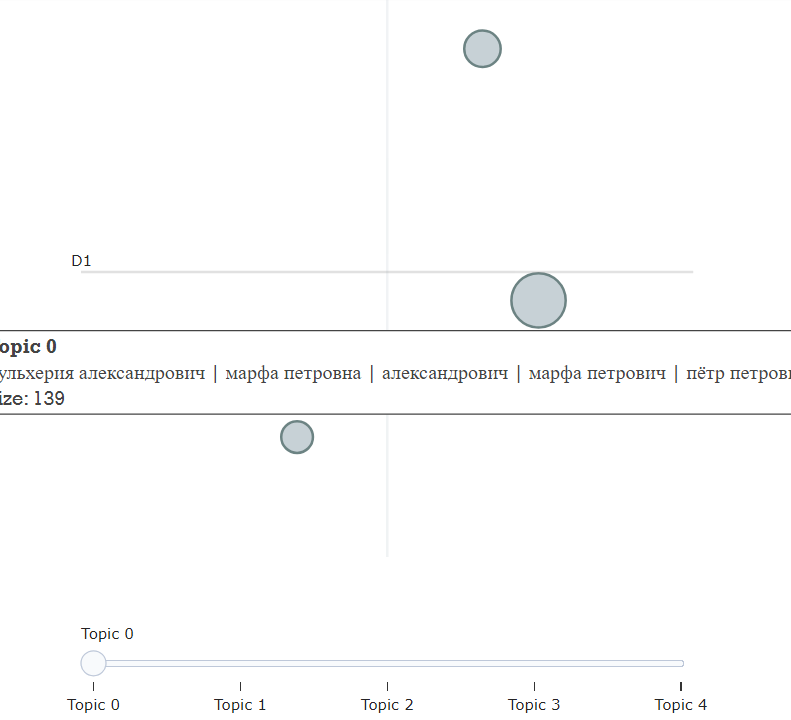

In [1065]:
topic_model.visualize_documents(text)

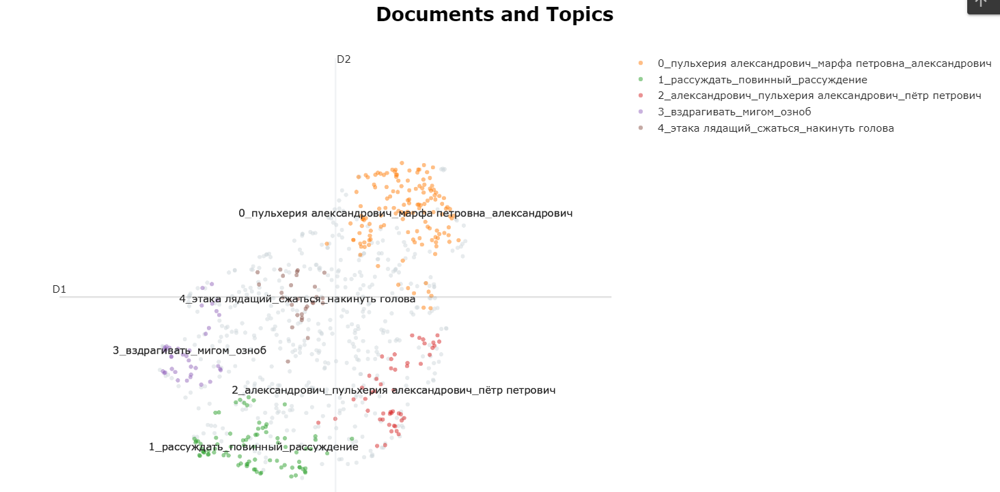

In [1066]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


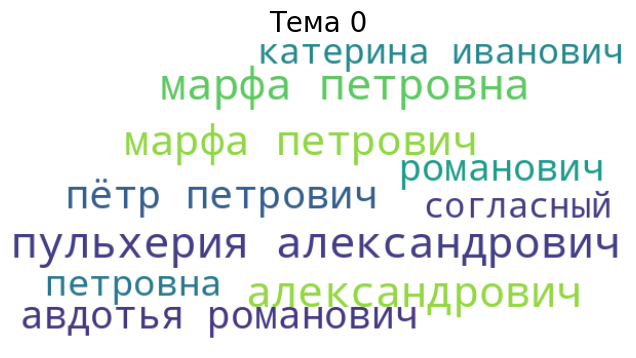

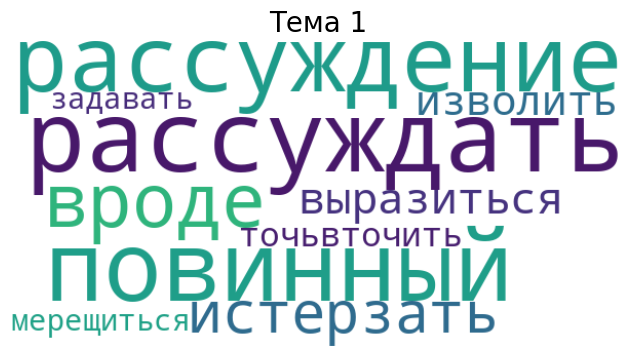

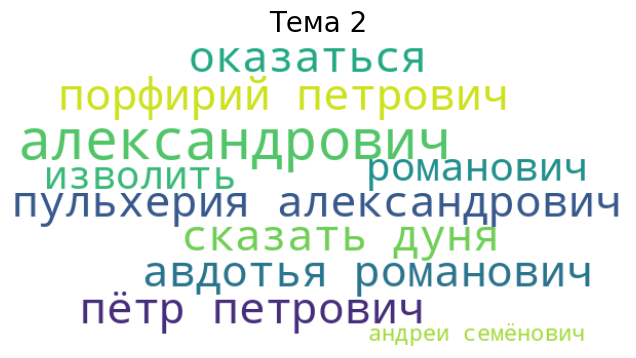

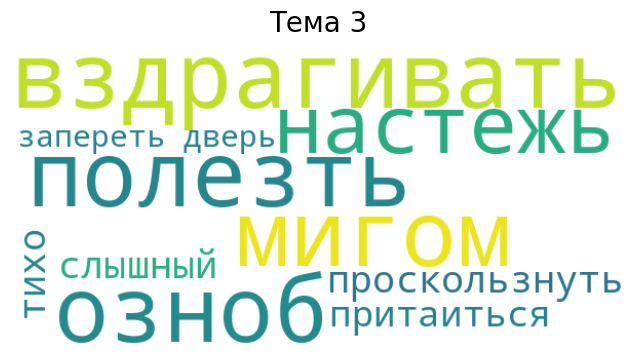

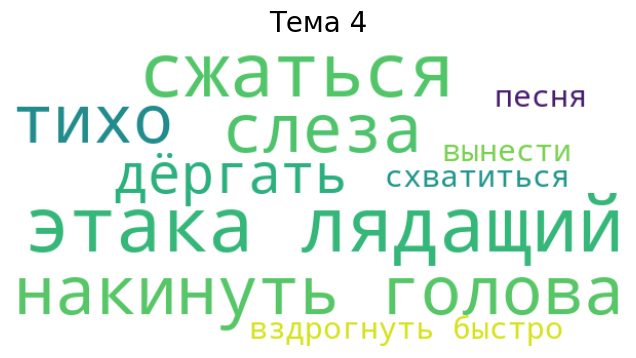

In [1067]:
for topic_id in topics_info['Topic']:
    if topic_id == -1:
        continue
    topic_words = dict(topic_model.get_topic(topic_id))
    wordcloud = WordCloud(width=600, height=300, background_color ='white').generate_from_frequencies(topic_words)

    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Тема {topic_id}', fontsize=20)
    plt.axis('off')
    plt.show()

Курсивом буду выделять цитаты

Кратенько разберу интересные темы

 1. ```рассуждать, повинный, рассуждение, задать, выразиться```
эти слова часто встречаются в размышлениях Раскольникова, само слово ```рассуждение``` указывает на это
3. ```вздрагивать, настежь, ползти, мигом, озноб```

Реакция героя на какие-то внешние моменты, персонаж пытается спрятаться

4. ```сжаться, тихо, слеза, этака, лядащий```

Силыные эмоциональные переживания, опасность и напряжение, тут описывается внутреннюю борьбу Раскольникова

*прижать рукой стукать сердце, вздрагивать удар приятный, закружиться досадоить вскричать сторона, топор осторожно тихо подниматься, пройти двор мигом проскользнуть. опасаться испугаться надеяться разуверить взяться, остановиться посреди мостовой перекрёсток осматриваться кругом*



In [1069]:
print(f"Темы: {topics[3]}")
print(f"Вероятности: {probs[:50]}")

Темы: 3
Вероятности: [0.97700276 0.         0.99343897 0.90192029 0.         0.
 0.         0.         0.99755332 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.93432252 0.         0.         1.         0.         0.96931308
 0.73681233 0.         0.70237616 0.59038578 0.89744934 1.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         1.
 0.         1.         1.         0.96008423 0.60247168 0.80948033
 0.68188294 0.59038578]


Евклидово

In [1111]:
umap_model = UMAP(n_neighbors=30, n_components=7, min_dist=0.0, metric='euclidean')
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean' , cluster_selection_method='eom', prediction_data=True)


In [1112]:

vectorizer_model = CountVectorizer(
    ngram_range=(1, 2),
    max_df=0.95,                # исключение слишком частых терминов
    min_df=0.01,                # редкие
    max_features=10000          # размер словаря
)

In [1113]:

topic_model = BERTopic(
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  ctfidf_model=ctfidf_model,
  representation_model=representation_model
)

text = df_2['preprocess_text'].tolist()
topics, probs = topic_model.fit_transform(text)

In [1114]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,512,-1_броситься_воротиться_крикнуть_дрожать,"[броситься, воротиться, крикнуть, дрожать, ост...",[сгрести рука стоять среди комната печка прежд...
1,0,124,0_пульхерия александрович_марфа петровна_алекс...,"[пульхерия александрович, марфа петровна, алек...",[родя поверить подхватить спешить ответить зам...
2,1,55,1_рассуждать_задумать_изволить_изумление,"[рассуждать, задумать, изволить, изумление, пс...",[продолжать остроумие помоему великолепный вещ...
3,2,36,2_вздрогнуть_послышаться_вскрикнуть_прошептать,"[вздрогнуть, послышаться, вскрикнуть, прошепта...",[выдержать горько заплакать мрачной тоска смот...
4,3,34,3_марфа петрович_изволить_согласиться_признаться,"[марфа петрович, изволить, согласиться, призна...",[милый обожать человек продать наш штукато сос...
5,4,26,4_дверь_дверь квартира_проскользнуть_уговаривать,"[дверь, дверь квартира, проскользнуть, уговари...",[соня выйти канава очутиться вдвоём тротуар на...
6,5,24,5_пётр петрович_марфа петровна_александрович_п...,"[пётр петрович, марфа петровна, александрович,...",[верить мочь повторять озадаченный разумихин с...


In [1115]:
topic_model.visualize_documents(text)

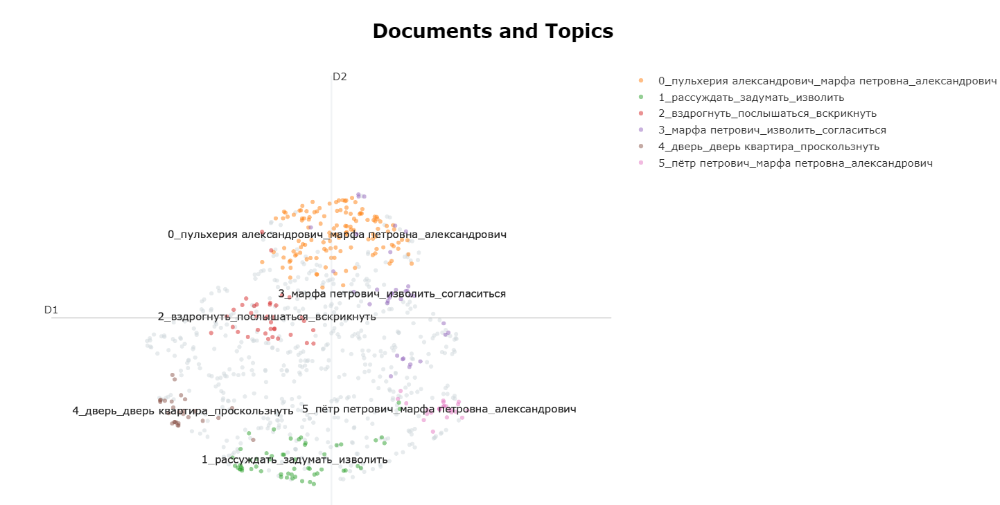

In [1116]:
topic_model.visualize_topics()

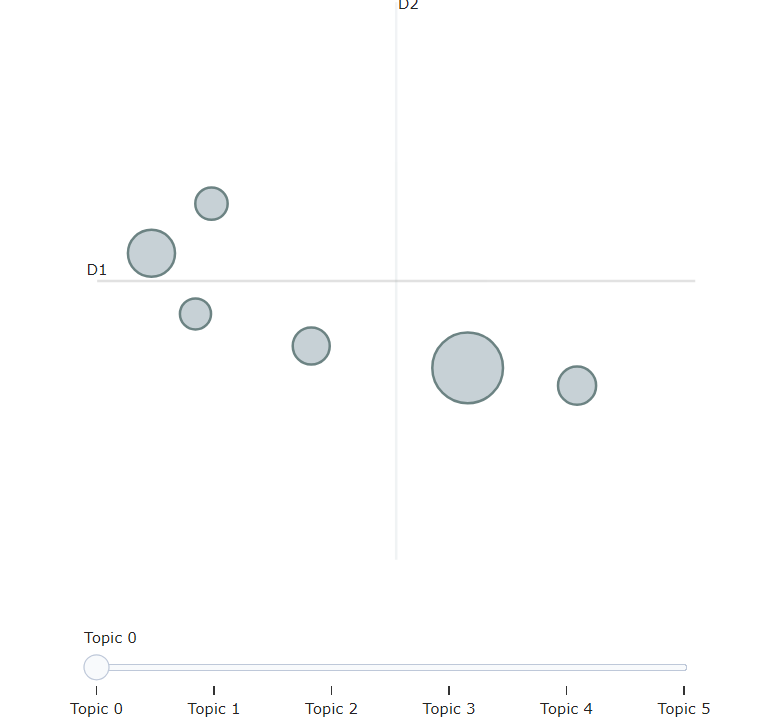

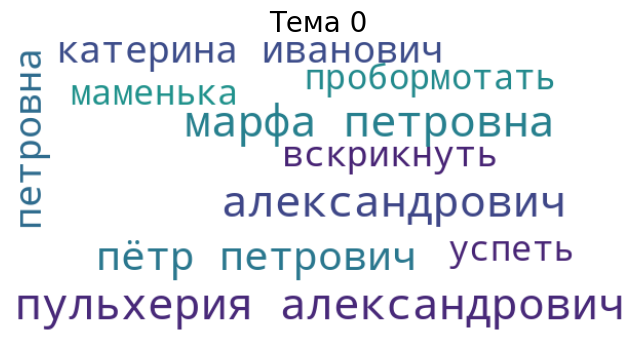

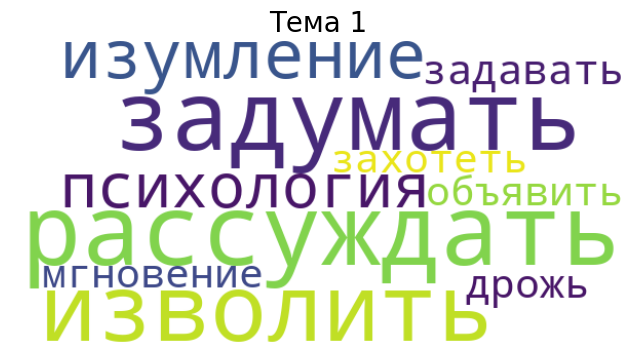

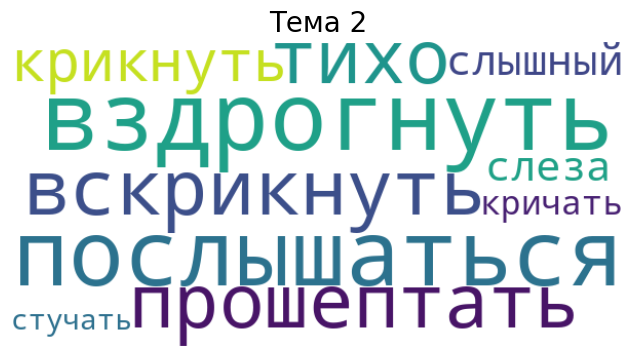

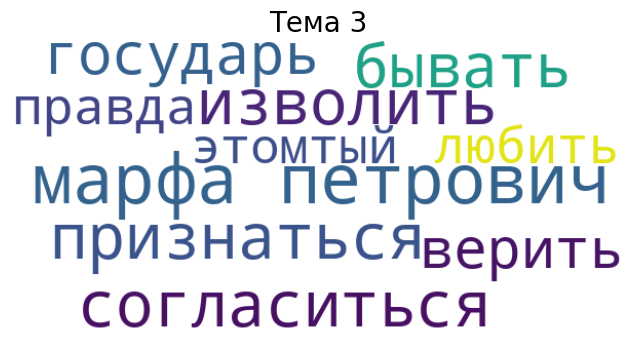

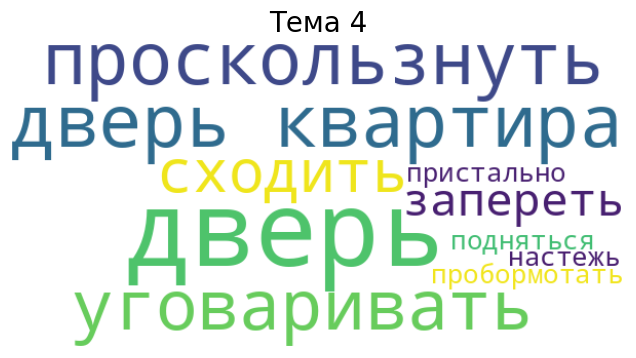

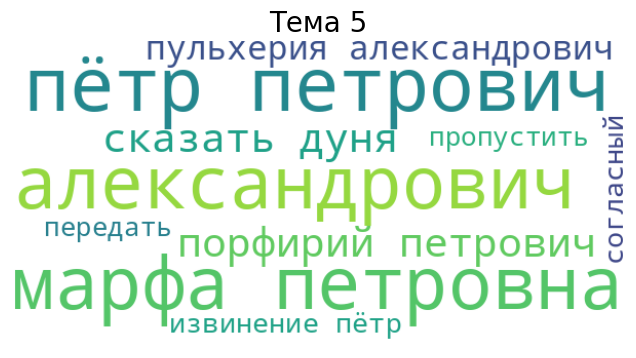

In [1117]:
for topic_id in topics_info['Topic']:
    if topic_id == -1:
        continue
    topic_words = dict(topic_model.get_topic(topic_id))
    wordcloud = WordCloud(width=600, height=300, background_color ='white').generate_from_frequencies(topic_words)

    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Тема {topic_id}', fontsize=20)
    plt.axis('off')
    plt.show()

In [1120]:
print(f"Темы: {topics[3]}")
print(f"Вероятности: {probs[:50]}")

Темы: -1
Вероятности: [0.         0.97561376 0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.67350533 0.         0.         0.         0.         0.
 0.         0.6431473  0.         0.97592443 1.         0.83900918
 0.97956592 0.         0.95009178 1.         0.81706833 1.
 0.         0.         1.         1.         0.96402457 0.
 0.         1.         0.         0.         0.         1.
 0.         0.64222416 0.67350533 0.6705578  0.67145181 1.
 0.         1.        ]


Темы:
0. ```пульхерия александрович,марфа петровна,александрович,пётр петрович,петровна,катерина иванович,вскрикнуть,маменька```

Семейные взаимоотношения

1. ```рассуждать, задумать, изволить, изумление, психология, задавать, захотеть, мгновение, дрожь, объявить```

Скорее всего это сцены диалогов, с размышлениями

2. ```вздрогнуть, послышаться, вскрикнуть, прошептать, тихо, крикнуть, слышный, слеза, кричать, стучать```

Реакция на окружающие действия, например, сцена прощения (Сонечки)

*выдержать горько заплакать мрачной тоска смотреть пройти минута пять право соня тихо проговорить перемениться выделаннонахальный бессильновызывающие тон исчезнуть голос ослабеть сказать вчера прощение прийти просить*

4. ```дверь, дверь квартира, проскользнуть, уговаривать, сходить, запереть, пробормотать, пристально, подняться, настежь```

описание каких-то скрытых осторожных действий героев


Манхэттенское

In [1146]:
umap_model = UMAP(n_neighbors=35, n_components=8, min_dist=0.0, metric='manhattan')
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='manhattan' , cluster_selection_method='eom', prediction_data=True)

vectorizer_model = CountVectorizer(
    ngram_range=(1, 2),
    max_df=0.95,                # исключение слишком частых терминов
    min_df=0.01,                # редкие
    max_features=10000          # размер словаря
)
topic_model = BERTopic(
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  ctfidf_model=ctfidf_model,
  representation_model=representation_model

)

text = df_3['preprocess_text'].tolist()
topics, probs = topic_model.fit_transform(text)

In [1147]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,493,-1_вскричать_слышать_пётр петрович_крикнуть,"[вскричать, слышать, пётр петрович, крикнуть, ...",[полминуты оба помолчать слушай разумихин заго...
1,0,120,0_пульхерия александрович_александрович_пётр п...,"[пульхерия александрович, александрович, пётр ...",[родя поверить подхватить спешить ответить зам...
2,1,102,1_рассуждать_вскричать_пристально_чувствовать,"[рассуждать, вскричать, пристально, чувствоват...",[справедливость дело помоему коль решаться ник...
3,2,46,2_вскрикнуть_прошептать_тихо_слеза,"[вскрикнуть, прошептать, тихо, слеза, слышный,...",[выдержать горько заплакать мрачной тоска смот...
4,3,19,3_марфа петрович_катерина иванович_петрович_че...,"[марфа петрович, катерина иванович, петрович, ...",[жить многие кроме содом безобразнеишие время ...
5,4,16,4_показаться_всплыть_впасть_пробить,"[показаться, всплыть, впасть, пробить, почувст...",[лестница вспомнить оставлять вещь обоиной дыр...
6,5,15,5_романович сказать_пётр петрович_пульхерия ал...,"[романович сказать, пётр петрович, пульхерия а...",[пульхерия александрович дрожать рука передать...


In [1148]:
topic_model.visualize_documents(text)

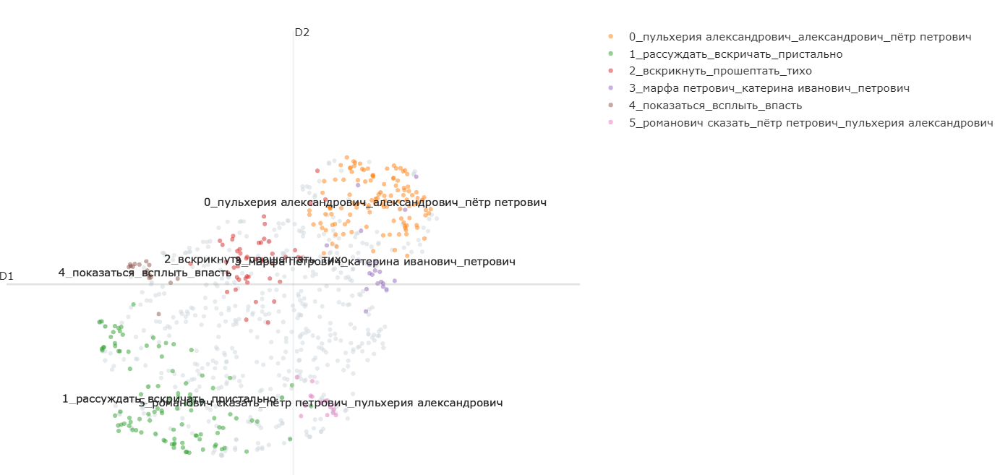

In [1149]:
topic_model.visualize_topics()

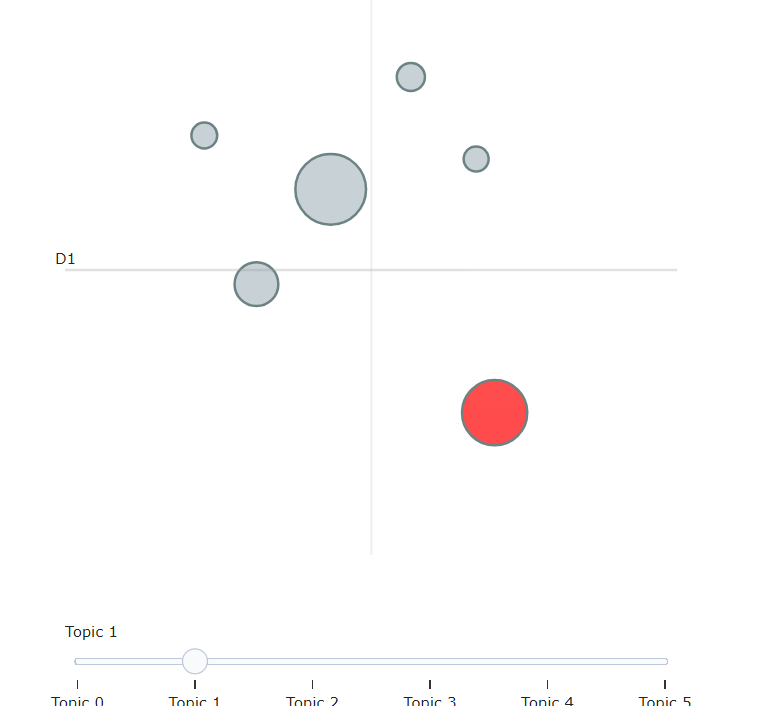

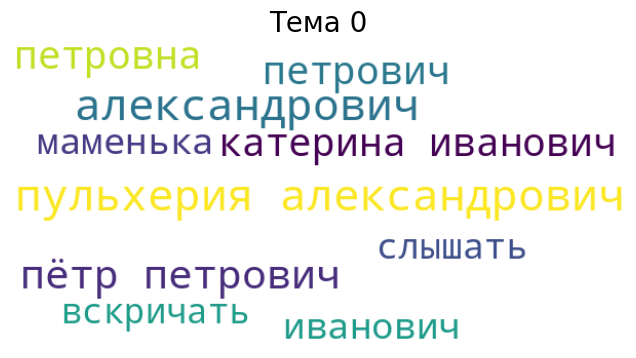

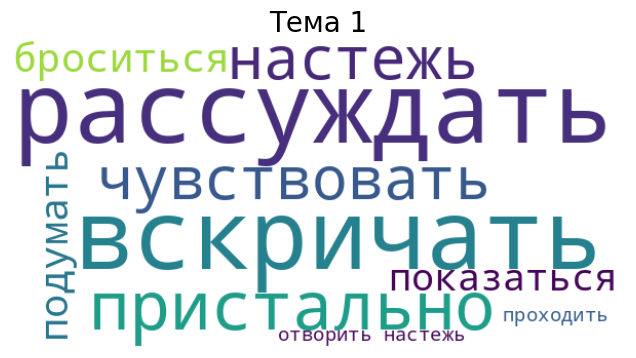

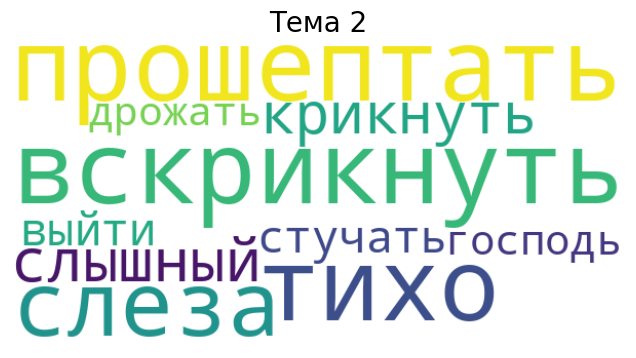

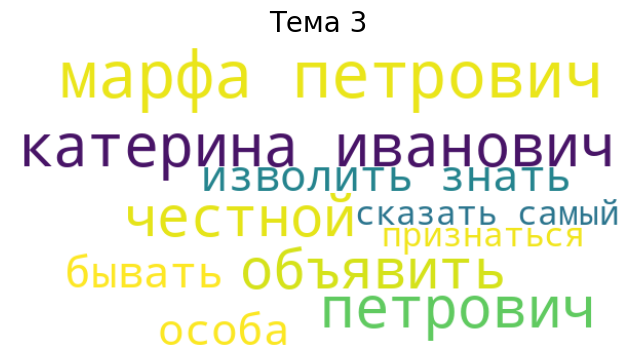

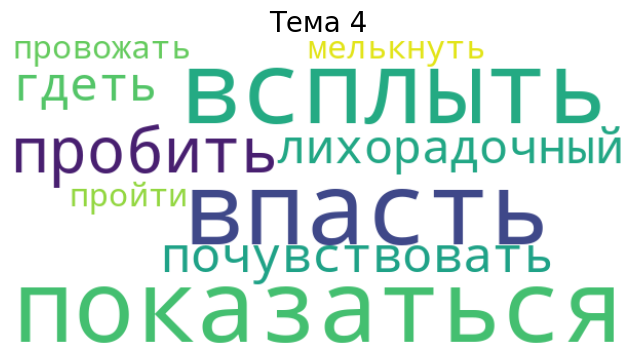

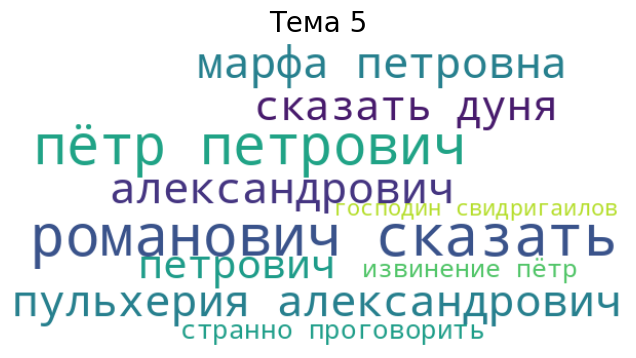

In [1150]:
for topic_id in topics_info['Topic']:
    if topic_id == -1:
        continue
    topic_words = dict(topic_model.get_topic(topic_id))
    wordcloud = WordCloud(width=600, height=300, background_color ='white').generate_from_frequencies(topic_words)

    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Тема {topic_id}', fontsize=20)
    plt.axis('off')
    plt.show()

Еще один результат


```
umap_model = UMAP(n_neighbors=30, n_components=7, min_dist=0.0, metric='cosine')
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean' , cluster_selection_method='eom', prediction_data=True)
```



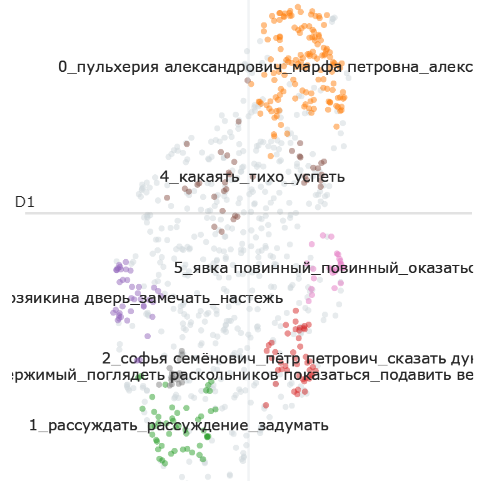
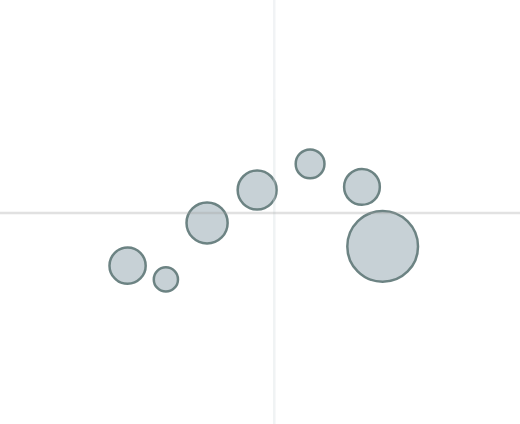

В данном примере мне очень понравился топик 5 - ```явка повинный, оказаться, подсудимый, убица```

Этот топик хорошо отделен и отражает "главную" мысль текста


Когерентность тут должна была быть, но у меня умер колаб